# Wealth vs Quality of Life - Do richer places lead better lives?
> *Sam Leahy, Juliana Lima, Bethania Sequera, Alex Tsai, Yi Zhang*

They say where you're born determines your future. Even with just a quick search online seems to suggest that many believe the ZIP Code you're born in greatly determines your station in life, including the [New York Times](https://www.nytimes.com/2020/05/19/learning/how-much-has-your-zip-code-determined-your-opportunities.html), [National Community Reinvestment Coalition](https://www.ncrc.org/your-zip-code-is-more-important-than-your-genetic-code/), and [Time Magazine](https://time.com/5608268/zip-code-health/).

However, how much of that statement is true? How much of those assumptions are verifiable? Is your birthplace really as much of an indicator of success as the pundits suggest? Does it really take a village to raise a child or does luck and individual aptitude play more of a factor? We hope to answer at least some aspects of this topic through 3 main questions.

## Contents:
### Setup:
1. [Modules and Dependencies](#M&D)
2. [API Requirements](#API)
### Question 1: Do richer places have better health outcomes?
> *Some health outcomes don't seem to be dependent on the relative wealth of an area, though which ones those are may surprise you*
1. [Metric Definitions](#MD1)
2. [Data Cleaning](#DC1)
3. Exploratory Data Analysis - Each subsection has a graphic and a brief analysis of the data reviewed
    - [Wealth Check](#EDA1-1)
    - [A Geographical View of Wealth](#EDA1-2)
    - [Health Check](#EDA1-3)
    - [Outlier Control](#EDA1-4)
4. Insights
    - [Correlation Table](#INS1-1) and more
    - [Linear Regressions](#INS1-2)
    - [Geographical Visualizations](#INS1-3)

### Question 2: Do richer places have better energy prices?
> *Not really*
1. [Data Cleaning](#DC2)
2. [Exploratory Data Analysis](#EDA2)
3. [Insights](#INS2)

### Question 3: Do richer places have better public order?
> *Not quite, at least at this demographical level*
1. [Data Cleaning](#DC3)
2. [Insights](#INS3)

<a id='M&D'></a>
# Setup
## Modules and Dependencies
Generally, all of the modules used here either come built-in with Python or the environment installed with the Conda command:
```python
conda create -n dev python=3.10 anaconda -y
```
If necessary, please follow the instructions on the associated [Github README file](https://github.com/AlexPei-YuTsai/BerkeleyDataBootcampProjectONE#installationprerequisites) and acquire all the packages necessary with the package installer of your choice as per each module's respective installation instructions.

In [1]:
# Using these for processing CSV files and doing math
from pathlib import Path
import pandas as pd
import scipy.stats as st
from scipy.stats import linregress
import numpy as np
import matplotlib.pyplot as plt
import math

# Using these to plot out geographical data
import hvplot.pandas
from holoviews.operation.datashader import rasterize

# Using these for any APIs we call
import requests
import json

<a id= "API"></a>
## API Requirements
All of our data was extracted via downloading CSV files from our various sources. Please refer to the documentation in this notebook or this project's GitHub repository for more information regarding how you can replicate the project on your own terms.

<a id='MD1'></a>
# Question 1: Do richer places have better health outcomes?
Logical reasoning dictates that if you need money to afford healthcare, then the richer households should have better healthcare and consequently lead healthier lives. However, is that true and to what extent is that assumption true? 

To answer this question, data from the IRS is used as a means of measuring "wealth" while data from the CDC is used as a means of measuring "health". The scope of our "places" is defined such that we are comparing wealth and health data on a **ZIP Code-level**.

## Metric Definitions
After some data cleaning and preparation, all of the charts and graphical representations of the data is generated with the `AGI+medical_data.csv` file exported into the `Resources` folder of this repository. These are the definitions of the columns in that exported dataframe:

### For Identification (This is also the basic point of data in which our metrics will be compared upon):
- **ZIPCODE:** The official 5-digit postal code of a particular area as defined by the data given by 2020 United States Postal Service. 
    - e.g.: 33480 is the ZIP Code for Palm Beach
- STATE: The 2-letter state abbreviation for the state a ZIP Code belongs to. 
    - e.g.: "NY" is New York, "CA" is California.
- lng: The longitude of a given ZIP Code in positive and negative degrees. Everything positive is *east* of the Prime Meridian, everything negative is *west* of it.
- lat: The latitude of a given ZIP Code. Everything positive is *north* of the equator, everything negative is *south* of it.

### For Wealth:

All of the data here is derived from the IRS's [2020 SOI Tax Data](https://www.irs.gov/statistics/soi-tax-stats-individual-income-tax-statistics-2020-zip-code-data-soi). The exact documentation can be downloaded from that website for your personal perusal.

- Total Individuals: The `N2` column of the raw downloadable tax data. Represents the number of individuals in that ZIP Code.  
- Total Income Amount: The `A02650` column. Represents the total income amount reported for a given ZIP Code in *thousands of dollars*.
- **Total Income per Individual(This is our definition of the "Wealth" of a ZIP Code):** Divide the Total Income Amount by the Total Individuals to get the Total Income per Individual of a ZIP Code. Since different ZIP Codes have different populations, we chose to normalize the wealth of each region by examining the average total income of each individual residing in that tabulated region.
    - *Disclaimer: The data might not be fully representative of the US's populations as many people are exempt from filing tax returns. However, as this is official IRS data, we find their data to be a suitable estimate even if the actual numbers are off.*
    
### For Health:

Each of our 30 other data column is collected from the [CDC's PLACES data](https://chronicdata.cdc.gov/500-Cities-Places/PLACES-ZCTA-Data-GIS-Friendly-Format-2022-release/kee5-23sr) and is a measure of some kind of health phenomenon. The exact data dictionary can be found in the previous link and their definition for what "prevalence" is and how it's calculated can be found in their [PLACES measure definitions](https://www.cdc.gov/places/measure-definitions/) page.

To summarize, the CDC's dataset has 4 kinds of health metrics: Health Outcomes (Arthritis, Cancer, etc.), Prevention (Various screenings and health insurance coverage), Health Risk Behaviors (Binge drinking, smoking, things that usually lead to poor health), and Health Status (Different ways people rate their own health).

Each metric is a "crude prevalence" reflecting a weighted, modified (depending on the methodology), estimated fraction of the resident adults of each ZIP Code with that given phenomenon where the denominator is the total considered population and the numerator is usually those who have been diagnosed with that condition by a licensed medical professional. Each of the data definitions below is merely a simple description, so do visit the sources given for a more comprehensive understanding of the scope and limits of each metric.

**Every column here is Health data compared with our Wealth metric (Names in `these marks` are the original names from the raw CDC PLACES CSV data):**

*Health Outcomes*

- Arthritis: `ARTHRITIS_CrudePrev` column. Prevalence of arthritis among adults over 18 years old.
- Current Asthma: `CASTHMA_CrudePrev` column. Prevalence of currently asthmatic adults over 18 years old.
- High Blood Pressure: `BPHIGH_CrudePrev` column. Prevalence of high blood pressure among adults over 18 years old.
- (Non-Skin) Cancer: `CANCER_CrudePrev` column. Prevalence of cancer (excluding skin cancer) among adults over 18 years old.
- High Cholesterol: `HIGHCHOL_CrudePrev` column. Prevalence of high cholesterol among adults over 18 years old.
- Chronic Kidney Disease: `KIDNEY_CrudePrev` column. Prevalence of chronic kidney disease among adults over 18 years old.
- Chronic Obstructive Pulmonary Disease: `COPD_CrudePrev` column. Prevalence of chronic obstructive pulmonary disease among adults over 18 years old.
- Coronary Heart Disease: `CHD_CrudePrev` column. Prevalence of coronary heart disease among adults over 18 years old.
- Depression: `DEPRESSION_CrudePrev` column. Prevalence of depression among adults over 18 years old.
- Diabetes: `DIABETES_CrudePrev` column. Prevalence of diagnosed diabetes among adults over 18 years old (excluding diabetes during pregnancy).
- Obesity: `OBESITY_CrudePrev` column. Prevalence of obesity among adults over 18 years old based on BMI results (excluding certain people and pregnant women).
- All Teeth Lost (Older Adults): `TEETHLOST_CrudePrev` column. Prevalence of losing all natural teeth due to tooth decay or gum disease among adults over 65 years old.
- Stroke: `STROKE_CrudePrev` column. Prevalence of strokes among adults over 18 years old.
- Cervical Cancer (Adult Women): `CERVICAL_CrudePrev` column. Prevalence of cervical cancer amongst adult women between 21 to 65 years old.

*Prevention*

- Lacking Health Insurance: `ACCESS2_CrudePrev` column. Prevalence of respondents who report having no current health insurance coverage amongst adults between 18 to 64 years old.
- Routine Health Checkups: `CHECKUP_CrudePrev` column. Prevalence of respondents who report having been to a doctor for a routine checkup (e.g., a general physical exam, not an exam for a specific injury, illness, condition) in the previous year amongst adults over 18 years old.
- Dentist Visits: `DENTAL_CrudePrev` column. Prevalence of respondents who report having been to the dentist or dental clinic in the previous year amongst adults over 18 years old.
- Taking Medicine for High Blood Pressure: `BPMED_CrudePrev` column. Prevalence of respondents who report taking medicine for high blood pressure amongst adults over 18 years old who have been diagnosed with high blood pressure.
- Cholesterol Screening: `CHOLSCREEN_CrudePrev` column. Prevalence of respondents who report having their cholesterol checked within the previous 5 years amongst adults over 18 years old.
- Mammography (Older Women): `MAMMOUSE_CrudePrev` column. Prevalence of respondents who report having had a mammogram within the previous 2 years amongst adult women between 50 to 74 years old.
- FOBT/Colon Screening (Older Adults): `COLON_SCREEN_CrudePrev` column. Prevalence of respondents who report having had 1) a fecal occult blood test (FOBT) within the past year, 2) a sigmoidoscopy within the past 5 years and a FOBT within the past 3 years, or 3) a colonoscopy within the past 10 years amongst adults between 50 to 75 years old.
- Core Clinical Prevention (Older Women): `COREW_CrudePrev` column. Prevalence of respondents reporting having received all of the following: an influenza vaccination in the past year; a pneumococcal vaccination (PPV) ever; either a fecal occult blood test (FOBT) within the past year, a sigmoidoscopy within the past 5 years and a FOBT within the past 3 years, or a colonoscopy within the previous 10 years; and a mammogram in the past 2 years amongst adult women over 65 years old.
- Core Clinical Prevention (Older Men): `COREM_CrudePrev` column. Prevalence of respondents reporting having received all of the following: an influenza vaccination in the past year; a PPV ever; and either a fecal occult blood test (FOBT) within the past year, a sigmoidoscopy within the past 5 years and a FOBT within the past 3 years, or a colonoscopy within the past 10 years amongst adult men over 65 years old.

*Health Risk Behaviors*

- Binge Drinking: `BINGE_CrudePrev` column. Prevalence of adults over 18 years old who report having five or more drinks (men) or four or more drinks (women) on an occasion in the past 30 days.
- Currently Smoking: `CSMOKING_CrudePrev` column. Prevalence of respondents who report having smoked ≥100 cigarettes in their lifetime and currently smoke every day or some days amongst adults over 18 years old.
- No Leisure-Time Physical Activity: `LPA_CrudePrev` column. Prevalence of respondents who answered “no” to the following question: “During the past month, other than your regular job, did you participate in any physical activities or exercises such as running, calisthenics, golf, gardening, or walking for exercise?” amongst adults over 18 years old.
- Less than 7 Hours of Sleep: `SLEEP_CrudePrev` column. Prevalence of respondents who report usually getting insufficient sleep (<7 hours for those aged ≥18 years, on average, during a 24-hour period) amongst adults over 18 years old.

*Health Status*

- 'Poor' Self-Rated Mental Health Status: `MHLTH_CrudePrev` column. Prevalence of respondents who report 14 or more days during the past 30 days during which their mental health was not good amongst adults over 18 years old.
- 'Poor' Self-Rated Physical Health Status: `PHLTH_CrudePrev` column. Prevalence of respondents who report 14 or more days during the past 30 days during which their physical health was not good among adults over 18 years old.
- 'Fair' or 'Poor' Self-Rated Health Status: `GHLTH_CrudePrev` column. Prevalence of respondents who report their general health status as “fair” or “poor.”

Any potential limitations in their dataset can be found on their website in the PLACES measure definitions page given above.

<a id='DC1'></a>
## Data Cleaning

The file below named `AGI+coords_data.csv` is processed from a larger file that is not included in this GitHub repository due to its sheer size. However, for those who are interested, the file used merges select columns of the [Statistics of Income  - Tax Data from the IRS](https://www.irs.gov/statistics/soi-tax-stats-individual-income-tax-statistics-2020-zip-code-data-soi) file with the [ZIP Codes to Map Coordinates conversion file](https://simplemaps.com/data/us-zips).

As per the Metric Definitions above, we only selected the columns the `STATE`, `ZIPCODE`, `N2`, and `A02650` columns, which later got merged with the `Resources/uszips.csv` file's `zip`, `lat`, and `lng` columns. The data was merged on the ZIP Code columns both CSV files have. Furthermore, the data may have been sorted by Total Income per Individual beforehand.

In [2]:
# Get Independent Variable Data
test_df = pd.read_csv("Resources/AGI+coords_data.csv")

# As per the Metric Definitions, all money columns here are in thousands of dollars

# Also dropped 3 rows because some ZIPs didn't have coordinates, apparently. Columns renamed for personal convenience
test_df = test_df.drop(["Unnamed: 0", "index"], axis=1).dropna(axis="index", how="any").rename(columns={"N2":"Total Individuals", "A02650":"Total Income Amount"})
test_df

,STATE,ZIPCODE,Total Individuals,Total Income Amount,Total Income per Individual,lng,lat
0,MS,38738,140.0,5.770000e+02,4.121429,-90.53653,33.93049
1,MO,64147,280.0,1.591000e+03,5.682143,-94.54688,38.85387
2,SD,57794,390.0,3.206000e+03,8.220513,-102.40695,43.12071
3,TN,37140,390.0,3.239000e+03,8.305128,-87.65245,35.86345
4,MT,59444,270.0,2.321000e+03,8.596297,-111.34881,48.65227
...,...,...,...,...,...,...,...
27637,CA,94301,14750.0,1.527798e+07,1035.795390,-122.14992,37.44424
27638,CA,94027,5820.0,6.971688e+06,1197.884536,-122.20313,37.45399
27639,FL,33480,9050.0,1.466156e+07,1620.061768,-80.04075,26.69796
27640,CA,94104,1510.0,2.990505e+06,1980.466887,-122.40211,37.79144


Next, we have to import the dependent variables. All this is extracted from the CDC's PLACES data referred to in the Metric Definitions section and the full CSV can be found in the `Resources` folder if better analysis can be made with the columns I chose not to use.

The goal is to correlate the Total Income per Individual with the various health metrics described to see if ZIP Codes with higher average individual wealth have better health than those with lower average individual wealth.

Though ZCTA5 isn't completely equivalent to ZIPCodes according to online definitions, it's close enough such that it's generally interexchangeable given how they are mostly, if not completely equal in terms of their general coordinate positions. Also, all the `95CI` columns, data describing the upper and lower bound of their estimates given their 95% confidence interval, are dropped as we only need to find correlations with one type of metric (bigger numbers or smaller numbers for all would not change the strength of a correlation). Lastly, the `TotalPopulation` and `Geolocation` columns are dropped as they are not necessary with the corresponding data columns we have in our `AGI+coords_data.csv` file.

In [3]:
# Get Dependent Variable Data
med_df = pd.read_csv("Resources/PLACES__ZCTA_Data__GIS_Friendly_Format___2022_release.csv")
med_df

# TotalPopulation and Geolocation columns match up pretty well with the tax information dataset, so these columns are also safe to ignore

,ZCTA5,TotalPopulation,ACCESS2_CrudePrev,ACCESS2_Crude95CI,ARTHRITIS_CrudePrev,ARTHRITIS_Crude95CI,BINGE_CrudePrev,BINGE_Crude95CI,BPHIGH_CrudePrev,BPHIGH_Crude95CI,...,OBESITY_Crude95CI,PHLTH_CrudePrev,PHLTH_Crude95CI,SLEEP_CrudePrev,SLEEP_Crude95CI,STROKE_CrudePrev,STROKE_Crude95CI,TEETHLOST_CrudePrev,TEETHLOST_Crude95CI,Geolocation
0,8065,7398,11.8,"(10.6, 13.0)",23.6,"(22.8, 24.3)",17.0,"(16.8, 17.2)",NaN,NaN,...,"(31.5, 33.0)",9.2,"( 8.7, 9.7)",36.9,"(36.0, 37.7)",2.8,"( 2.7, 3.0)",12.4,"(10.0, 15.2)",POINT (-75.035071 40.00536195)
1,28443,17512,13.7,"(12.4, 15.1)",25.2,"(24.5, 25.9)",16.3,"(16.1, 16.5)",33.1,"(32.3, 33.8)",...,"(27.3, 28.8)",9.2,"( 8.7, 9.7)",32.0,"(31.2, 32.8)",2.8,"( 2.7, 3.0)",10.3,"( 8.6, 12.6)",POINT (-77.67400103 34.40735763)
2,3103,36476,16.1,"(15.2, 17.1)",23.4,"(22.9, 23.8)",18.0,"(17.8, 18.2)",29.4,"(29.0, 29.8)",...,"(32.4, 33.4)",11.3,"(10.8, 11.7)",36.2,"(35.7, 36.7)",2.8,"( 2.6, 2.9)",17.0,"(14.5, 19.7)",POINT (-71.44426868 42.95332718)
3,4042,4281,12.0,"( 9.6, 14.7)",25.6,"(24.2, 26.9)",16.6,"(16.0, 17.2)",29.7,"(28.3, 31.1)",...,"(29.3, 32.5)",8.5,"( 7.5, 9.5)",33.1,"(31.4, 34.7)",2.4,"( 2.2, 2.7)",13.0,"( 8.4, 18.3)",POINT (-70.62451707 43.62953242)
4,1109,30250,14.1,"(13.2, 15.1)",24.6,"(24.3, 24.9)",14.8,"(14.5, 14.9)",33.9,"(33.6, 34.2)",...,"(37.7, 38.6)",12.4,"(12.0, 12.8)",42.2,"(41.6, 42.7)",4.0,"( 3.8, 4.1)",25.6,"(23.3, 28.0)",POINT (-72.54882748 42.11839795)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32404,90249,26669,15.7,"(14.7, 16.8)",17.9,"(17.5, 18.3)",15.6,"(15.5, 15.7)",29.8,"(29.4, 30.2)",...,"(29.4, 30.4)",9.8,"( 9.4, 10.2)",35.6,"(35.0, 36.1)",3.0,"( 2.9, 3.2)",11.2,"( 9.2, 13.8)",POINT (-118.3170528 33.90148653)
32405,92551,30815,21.0,"(19.7, 22.3)",17.1,"(16.9, 17.4)",19.0,"(18.8, 19.2)",27.4,"(27.1, 27.7)",...,"(36.6, 37.4)",11.0,"(10.6, 11.4)",37.6,"(37.1, 38.0)",2.5,"( 2.4, 2.6)",14.6,"(13.4, 15.9)",POINT (-117.2261219 33.88144718)
32406,98226,41235,10.3,"( 9.7, 11.0)",24.8,"(24.3, 25.3)",19.0,"(18.8, 19.2)",29.8,"(29.3, 30.2)",...,"(27.4, 28.2)",10.4,"(10.1, 10.7)",28.4,"(28.0, 28.8)",3.0,"( 2.8, 3.1)",11.5,"( 9.8, 13.4)",POINT (-122.4247832 48.80190392)
32407,87553,1209,19.8,"(16.5, 23.5)",25.2,"(24.2, 26.3)",11.9,"(11.5, 12.1)",35.0,"(33.8, 36.2)",...,"(27.8, 29.6)",13.9,"(13.2, 14.7)",32.4,"(31.6, 33.3)",3.9,"( 3.5, 4.3)",15.3,"(12.6, 18.5)",POINT (-105.706967 36.20595411)


In [4]:
# We'll ignore any of the CI columns and keep the ZCTA5 column, so there should be 31 columns left

# Extract all Prevalence columns
prev_df = med_df.filter(like="Prev")

# Can't forget to get the ZIP Code data or else there would be nothing to merge on
prev_df.insert(0, "ZIPCODE", med_df.loc[:, "ZCTA5"])

# Drop nulls
a_df = prev_df.dropna(axis="index", how="any")

# Join data on ZIP Codes, drop nulls again just in case, and rename them for presentation purposes
medical_df = test_df.merge(a_df, how="left", on="ZIPCODE").dropna(axis="index", how="any")\
.rename(columns=
        {# Health Outcomes
         "ARTHRITIS_CrudePrev":"Arthritis", "BPHIGH_CrudePrev":"High Blood Pressure", "CANCER_CrudePrev":"(Non-Skin) Cancer", 
         "CASTHMA_CrudePrev":"Current Asthma", "CERVICAL_CrudePrev":"Cervical Cancer (Adult Women)", "CHD_CrudePrev":"Coronary Heart Disease",
         "COPD_CrudePrev":"Chronic Obstructive Pulmonary Disease", "DEPRESSION_CrudePrev":"Depression", "DIABETES_CrudePrev":"Diabetes",
         "HIGHCHOL_CrudePrev":"High Cholesterol", "KIDNEY_CrudePrev":"Chronic Kidney Disease", "OBESITY_CrudePrev":"Obesity", "STROKE_CrudePrev":"Stroke", "TEETHLOST_CrudePrev":"All Teeth Lost (Older Adults)",
         # Prevention 
         "ACCESS2_CrudePrev":"Lacking Health Insurance", "BPMED_CrudePrev":"Taking Medicine for High Blood Pressure",
         "CHECKUP_CrudePrev":"Routine Health Checkups", "CHOLSCREEN_CrudePrev":"Cholesterol Screening", 
         "COLON_SCREEN_CrudePrev":"FOBT/Colon Screening (Older Adults)",  "COREM_CrudePrev":"Core Clinical Prevention (Older Men)", "COREW_CrudePrev":"Core Clinical Prevention (Older Women)",
         "DENTAL_CrudePrev":"Dentist Visits", "MAMMOUSE_CrudePrev":"Mammography (Older Women)",
         # Health Risk Behaviors
         "BINGE_CrudePrev":"Binge Drinking", "CSMOKING_CrudePrev":"Currently Smoking", "LPA_CrudePrev":"No Leisure-Time Physical Activity",
         "SLEEP_CrudePrev":"Less than 7 Hours of Sleep", 
         # Health Status
         "GHLTH_CrudePrev":"'Fair' or 'Poor' Self-Rated Health Status", "MHLTH_CrudePrev":"'Poor' Self-Rated Mental Health Status", 
         "PHLTH_CrudePrev":"'Poor' Self-Rated Physical Health Status"
        })

# Note: Each of the Health Outcomes columns is the "Crude Prevalence" of that particular health phenomenon
# Note: Unless mentioned otherwise, these stats are measured for adults
medical_df

,STATE,ZIPCODE,Total Individuals,Total Income Amount,Total Income per Individual,lng,lat,Lacking Health Insurance,Arthritis,Binge Drinking,...,High Cholesterol,Chronic Kidney Disease,No Leisure-Time Physical Activity,Mammography (Older Women),'Poor' Self-Rated Mental Health Status,Obesity,'Poor' Self-Rated Physical Health Status,Less than 7 Hours of Sleep,Stroke,All Teeth Lost (Older Adults)
0,MS,38738,140.0,5.770000e+02,4.121429,-90.53653,33.93049,32.1,18.5,17.6,...,28.1,2.6,33.0,79.5,15.5,49.2,11.3,41.0,3.5,28.3
1,MO,64147,280.0,1.591000e+03,5.682143,-94.54688,38.85387,19.1,9.0,21.1,...,13.2,1.2,22.9,81.3,21.9,31.9,6.9,37.4,1.0,21.7
2,SD,57794,390.0,3.206000e+03,8.220513,-102.40695,43.12071,20.0,24.0,19.7,...,24.3,4.4,38.5,73.4,20.0,45.5,18.1,35.4,5.9,41.8
3,TN,37140,390.0,3.239000e+03,8.305128,-87.65245,35.86345,27.6,17.0,19.5,...,25.8,2.0,28.5,70.0,16.6,43.0,10.1,43.2,2.5,22.9
4,MT,59444,270.0,2.321000e+03,8.596297,-111.34881,48.65227,15.2,26.5,22.4,...,31.6,3.0,23.5,70.1,15.2,32.9,12.3,32.7,3.3,17.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27634,CA,94301,14750.0,1.527798e+07,1035.795390,-122.14992,37.44424,4.9,19.2,18.2,...,29.0,2.4,12.7,76.6,10.4,20.2,6.5,24.0,2.1,4.7
27635,CA,94027,5820.0,6.971688e+06,1197.884536,-122.20313,37.45399,4.9,22.6,15.6,...,36.9,2.7,12.7,76.1,10.2,20.0,7.2,24.7,2.4,4.9
27636,FL,33480,9050.0,1.466156e+07,1620.061768,-80.04075,26.69796,10.7,32.9,8.6,...,42.1,4.4,20.2,79.3,8.8,19.4,10.2,25.3,4.4,8.3
27637,CA,94104,1510.0,2.990505e+06,1980.466887,-122.40211,37.79144,10.7,20.3,13.5,...,34.1,2.9,22.5,65.4,11.1,18.6,9.4,30.2,3.3,10.3


<a id="EDA1-1"></a>
## Exploratory Data Analysis

The following is some of the univariate and bivariate data explorations we did to get a better understanding of what we are looking at.

### Wealth Check

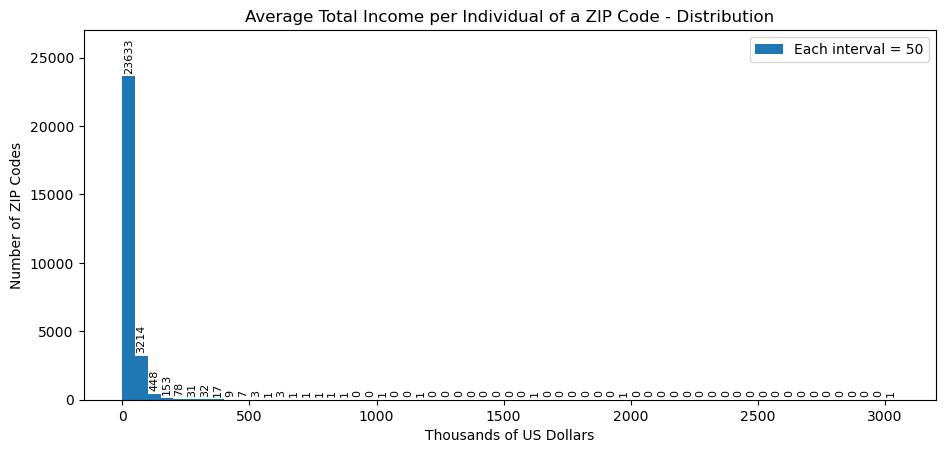

Minimum: 4.121428571428571
Maximum: 3035.926923653846
Mean: 39.052928410344045
Median: 31.46428577380952
1st Quartile: 25.873887987012985
3rd Quartile: 40.45460299965004
IQR: 14.580715012637057
Safe Bounds: 4.002815468057399 - 62.32567551860563


In [5]:
# Setting up a histogram here

# This bit of code is for me to manually set up bin intervals for easier readability
dbins = [i*50.0 for i in range(62)]

plt.figure(figsize=(11,4.8)) 
counts, bins, bars = plt.hist(test_df["Total Income per Individual"], bins=dbins, label="Each interval = 50")
plt.bar_label(bars, fontsize=8, rotation="vertical", padding=2)
plt.ylim(0,27000)
plt.title("Average Total Income per Individual of a ZIP Code - Distribution")
plt.xlabel("Thousands of US Dollars")
plt.ylabel("Number of ZIP Codes")
plt.legend()

plt.show()

# If you're wondering why the chart is so wide, it's because wealth disparity sucks and the Income/Capita in Miami Beach is $3 million
# This calls for a little outlier treatment
q1 = np.quantile(test_df["Total Income per Individual"], .25)
q3 = np.quantile(test_df["Total Income per Individual"], .75)
iqr = q3-q1
ub = 1.5*iqr+q3
lb = q1-1.5*iqr
print(f"Minimum: {test_df['Total Income per Individual'].min()}")
print(f"Maximum: {test_df['Total Income per Individual'].max()}")
print(f"Mean: {test_df['Total Income per Individual'].mean()}")
print(f"Median: {test_df['Total Income per Individual'].median()}")
print(f"1st Quartile: {q1}")
print(f"3rd Quartile: {q3}")
print(f"IQR: {iqr}")
print(f"Safe Bounds: {lb} - {ub}")

# We'll be using the "1.5xIQR rule" heuristic and saving the upper bound for further data treatment later if necessary
# The lower bound is not necessary because none of the data will ever exceed that

You can notice that 85% of all ZIP Codes here in the US has an average Total Income per Individual of less than or equal to $50,000. Considering that the maximum of this dataset is easily over 60 times the value of that bar and 50 times over the upper bound of the 1.5xIQR rule, it's easy to see how the outliers of this dataset easily affected the mean and any other statistic regarding averages.

The median ZIP Code has people earning about $30,000 per tax year, which is rather unfortunate. Perhaps it's poor calculation on our part, but it definitely seemed a lot lower than expected.

<a id="EDA1-2"></a>
### A Geographical View of Wealth
There's this neat little data visualization method called ["choropleth maps"](https://en.wikipedia.org/wiki/Choropleth_map) that is very fascinating and compelling when geographical data is involved. Using some Geographic Information System (GIS) magic and coding finesse, the product can easily tell people what the land is like at a glance by scaling the values of a particular data column with color and mapping them onto the geographical map of the land - a true application of the old adage "A picture is worth a thousand words."

Unfortunately, given our limited time, it didn't feel appropriate to waste too much time learning new modules and painstakingly debugging unfamiliar code, so we opted for an "off-brand" version with something we are more familiar with: HVPlot.

It's not a perfect visualization with demarcated ZIP Code tabulation areas, but the collection of points are still substantial enough to tell a story without us typing a single word.

We simply followed [HVPlot documentation](https://hvplot.holoviz.org/user_guide/Customization.html) to figure out what keyword arguments to include in these blocks of code to create a nation-level and state-level view of the US's wealth distribution.

*Note: Given their interactive functionality, HVPlot maps aren't saved on Jupyter Notebooks, so you'll have to run the notebook yourself to get an idea of what the maps look like. A static screenshot of the nation and state-level views are saved in `Results/EDA_Nation.png` and `Results/EDA_NY.png`, respectively. Please examine the folder and view them for yourself.*

In [6]:
# National View

# Map starts out pretty far because we're also including Hawaii and Alaska
# Non-datashaded map works, but it's super laggy with 27k points, so we'll stick with this for big visualizations

money_plot = test_df.hvplot.points(
    "lng",
    "lat",
    geo = True,
    tiles = "CartoLight",
    frame_width = 800,
    frame_height = 400,
    scale = .7,
    color = "Total Income per Individual",
    cmap = "hot_r",
    colorbar = True,
    datashade=True,
    dynspread=True,
    xlabel="Longitude",
    ylabel="Latitude",
    title= "ZIPCODES by MONEY"
)
print("Black = Big Money, Yellow = Small Money")
money_plot

Black = Big Money, Yellow = Small Money


:DynamicMap   []
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .RGB.I   :RGB   [lng,lat]   (R,G,B,A)

Due to some code issues we've decided not to pursue, the color legend does not appear with this datashaded version of the map. Because of the parameters we've included in the code block above, some patches of colors may also not be completely representative of the reality of the country.

*You can remove the `datashade = True` and `dynspread = True` keyword arguments to have a more accurate view of the US and have a color bar to indicate the relative wealth of a ZIP Code, but we advise against that unless your computer has substantial processing power given how computationally costly it is to graphically render 27,000 points on a map.*

However, even with this simple visualization, it's easy to see where the money is in this country. On the west coast, you can see big blobs of wealthy ZIP Codes around Los Angeles, San Francisco, and Seattle while the Northeast as a whole seems to be comparatively more comfortable than the rest of the country.

In [7]:
# State View
teststate_df = test_df.loc[test_df["STATE"]=="NY"]

money_plot = teststate_df.hvplot.points(
    "lng",
    "lat",
    geo = True,
    tiles = "CartoLight",
    frame_width = 800,
    frame_height = 400,
    scale = .7,
    color = "Total Income per Individual",
    cmap = "hot_r",
    colorbar = True,
    xlabel="Longitude",
    ylabel="Latitude",
    title= "ZIPCODES by MONEY"
)

money_plot

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [lng,lat]   (Total Income per Individual)

Almost as if you're pinching a wet piece of tissue paper and pulling it up from the table, the wealth of New York seems to decrease drastically away from one single key point. You can notice how all the ZIP Codes with the highest average Total Income per Individual values are around or in Manhattan and that the colors of the dots rapidly go down to bright yellow as you leave the hustle and bustle of the Big Apple Concrete Jungle.

These cluttered up visualizations by themselves aren't too helpful for strict, rigorous statistical analysis, but they do allow for very quick, visually compelling insights even if the viewers aren't aware of the actual numbers.

<a id="EDA1-3"></a>
### Health Check

We'll briefly explore the dependent variable here. As there are about 30 of them to be looked at, this will just be an extremely abridged look at health data as the CDC themselves probably has all the insights you'll need in terms of univariate data in that regard.

In [8]:
# Setup for later (It was easier to do EDA in this order)
corr_table = medical_df.drop(labels=["STATE", "ZIPCODE", "Total Individuals", "Total Income Amount", "lng", "lat"], axis="columns").corr(method='pearson')
strength = corr_table.loc[:, "Total Income per Individual"].abs().sort_values(ascending=False)

strength.index
# This is an array of sorts, so you can access (for example) "Total Income per Individual" by calling strength.index[0]
# This array is here so we can iteratively access columns of our dataframe easier

Index(['Total Income per Individual', 'Obesity', 'Currently Smoking',
       'All Teeth Lost (Older Adults)', 'No Leisure-Time Physical Activity',
       'Dentist Visits', ''Poor' Self-Rated Physical Health Status',
       ''Fair' or 'Poor' Self-Rated Health Status',
       ''Poor' Self-Rated Mental Health Status', 'Less than 7 Hours of Sleep',
       'Chronic Obstructive Pulmonary Disease', 'Diabetes', 'Current Asthma',
       'Stroke', 'Cholesterol Screening', 'High Blood Pressure', 'Depression',
       'Core Clinical Prevention (Older Women)',
       'Cervical Cancer (Adult Women)', 'Chronic Kidney Disease',
       'Core Clinical Prevention (Older Men)', 'Lacking Health Insurance',
       'Coronary Heart Disease', 'Arthritis',
       'FOBT/Colon Screening (Older Adults)', 'Mammography (Older Women)',
       'High Cholesterol', 'Taking Medicine for High Blood Pressure',
       'Binge Drinking', '(Non-Skin) Cancer', 'Routine Health Checkups'],
      dtype='object')

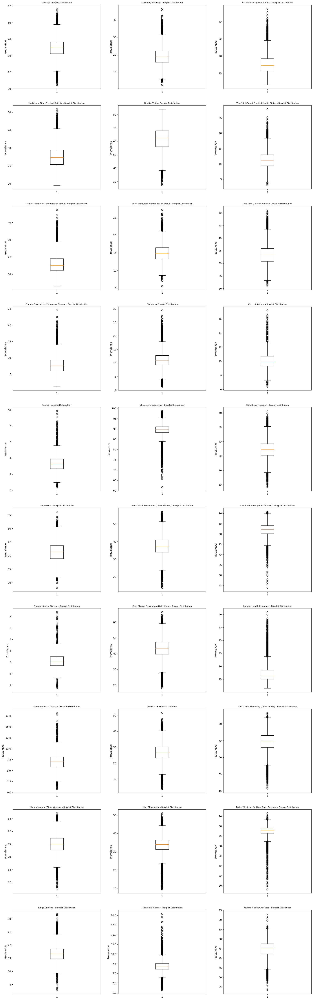

In [9]:
# Boxplots here

rows = 10
cols = 3
fig, axs = plt.subplots(rows, cols)
fig.set_figheight(7*rows)
fig.set_figwidth(7*cols)
for i in range(rows):
    for j in range(cols):
        X = strength.index[i*cols+j+1]
        axs[i, j].boxplot(medical_df[X])
        axs[i, j].set_title(f"{X} - Boxplot Distribution", fontdict={"fontsize":8})
        axs[i, j].set_ylabel("Prevalence")
plt.show()

Notably, there are quite a few outliers regardless of the dataset. However, in the grand scheme of things (especially when you try the histographic visualization of the data), the data is reasonably normally distributed. Given that the data is measured in terms of prevalence, no individual data point is so outrageous that it should be removed from consideration.

We would like to point out some of the boxplots of note, however:
- ZIP Codes with residents lacking health insurance coverage seemed to range from near 0% to over 60%. Similarly, high blood pressure medication prevalence ranges from 90% to below 20%. Given the wealth disparity of this nation, it wouldn't be unreasonable to suspect that average income is associated with distributions of health phenomena involving transactions and pharmaceutical administration, especially when considering the price of healthcare in this country.
- Stroke and chronic kidney disease prevalences seem to be relatively consistent given their lack of range. None of us are medical professionals, but perhaps the range of distributions in our dependent variables is a good sign of whether the correlations we're looking for will be strong or not.
- Thankfully, it does seem that the median prevalence for routine health checkups and many other screenings are reasonably high. At least people will be able to look at the bill and figure out what doomed them to a life of medical debt.

<a id="EDA1-4"></a>
### Outlier Control

In our exploratory data analysis of our Wealth independent variable, we noticed how skewed the distribution is. Since we would like to do linear regression, a model highly affected by outliers, in order to analyze our data, we'll need to decide what to do with data points we find to be undesirable.

In [10]:
# Define a function to create Linear Regression plots because this is a mouthful
# Takes in independent and dependent variables as series and spits back out a linear regression equation
# As we'll be needing Pearson-R stuff, it's in our best interest to use the more unruly SciPy method
def reg_this(x, y):
    result = linregress(x, y)
    
    # Access values with reg_this(x,y).slope, .intercept, .rvalue (Pearson-R), .pvalue (Hypothesis test for statistical significance of discovered regression), .stderr (Standard Error)
    return result

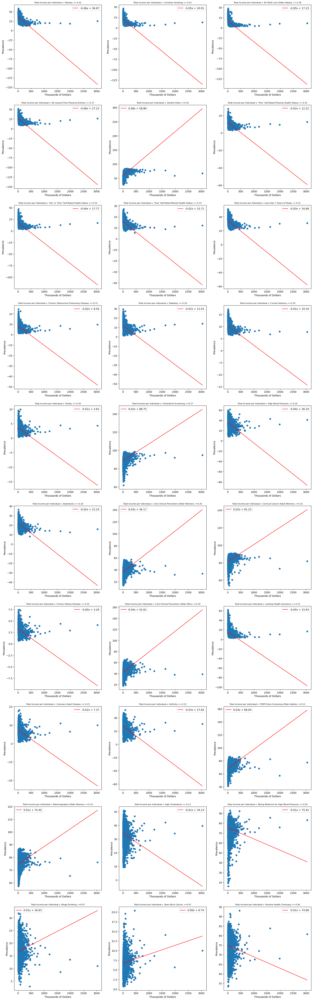

In [11]:
# Results indicate that we have to remove outliers for the charts to make sense, probably
# Results not necessarily best represented by linear models of regression

rows = 10
cols = 3
fig, axs = plt.subplots(rows, cols)
fig.set_figheight(7*rows)
fig.set_figwidth(7*cols)

# strength is a Pandas Series extracted from a correlation table we generated
# As a result, strength.index is an array of variable column names extracted from that series
# strength.index[0] is the independent variable, strength.index[everything else] are the dependent variables

# We'll iteratively compare our Wealth variable with all of the Health variables to see what we can assume at first glance
for i in range(rows):
    for j in range(cols):
        X = strength.index[0]
        Y = strength.index[i*cols+j+1]
        result = reg_this(medical_df[X], medical_df[Y])
        axs[i, j].scatter(medical_df[X], medical_df[Y])
        axs[i, j].plot(medical_df[X], (result.slope*medical_df[X]+result.intercept), label = f"{result.slope:.2f}x + {result.intercept:.2f}", color = "red")
        axs[i, j].set_title(f"{X} v. {Y}, r={result.rvalue:.2f}", fontdict={"fontsize":8})
        axs[i, j].set_xlabel("Thousands of Dollars")
        axs[i, j].set_ylabel("Prevalence")
        axs[i, j].legend(loc="best")
plt.savefig("Results/unculled_regressions_WealthvHealth.png")
plt.show()

At a glance, one could probably dismiss everything by saying that Wealth doesn't affect Health due to the weak to nonexistent correlation they have with each other, but the pictures themselves are noticably off. It's very obvious to see that every single regression chart here is disproprtionately affected by the data of the outliers especially with just how rich the richest ZIP Codes are. For that reason, we've decided to cull the outliers.

In [12]:
# ub is the upper bound defined by the 1.5xIQR Rule way back in the Wealth Check subsection
# We decided to drop about 10% of the data here
# We have considered assigning them as the average, but decided to drop it entirely
culled_df = medical_df.loc[medical_df["Total Income per Individual"] <= ub]
culled_df.to_csv("Resources/AGI+medical_data.csv")

# Correlation Table here
# Columns I'm interested in: any columns with a correlation coefficient of >0.6 

culled_corr_table = culled_df.drop(labels=["STATE", "ZIPCODE", "Total Individuals", "Total Income Amount", "lng", "lat"], axis="columns").corr(method='pearson')

# Ordered by strength of correlation (absolute value used). Note that none of the correlations here are stronger than 0.5
# However, because there could still be the chance that none of the graphs are LINEARLY correlated, it's still important to graph them somewhere and see if there are other relationships that make sense

culled_strength = culled_corr_table.loc[:, "Total Income per Individual"].abs().sort_values(ascending=False)

#NOTE: The .abs() function is called. These are absolute values of correlations, not the correlations themselves

culled_r2 = (culled_corr_table.loc[:, "Total Income per Individual"]**2).sort_values(ascending=False)

In [13]:
# Our dataset without the outliers
culled_df

,STATE,ZIPCODE,Total Individuals,Total Income Amount,Total Income per Individual,lng,lat,Lacking Health Insurance,Arthritis,Binge Drinking,...,High Cholesterol,Chronic Kidney Disease,No Leisure-Time Physical Activity,Mammography (Older Women),'Poor' Self-Rated Mental Health Status,Obesity,'Poor' Self-Rated Physical Health Status,Less than 7 Hours of Sleep,Stroke,All Teeth Lost (Older Adults)
0,MS,38738,140.0,5.770000e+02,4.121429,-90.53653,33.93049,32.1,18.5,17.6,...,28.1,2.6,33.0,79.5,15.5,49.2,11.3,41.0,3.5,28.3
1,MO,64147,280.0,1.591000e+03,5.682143,-94.54688,38.85387,19.1,9.0,21.1,...,13.2,1.2,22.9,81.3,21.9,31.9,6.9,37.4,1.0,21.7
2,SD,57794,390.0,3.206000e+03,8.220513,-102.40695,43.12071,20.0,24.0,19.7,...,24.3,4.4,38.5,73.4,20.0,45.5,18.1,35.4,5.9,41.8
3,TN,37140,390.0,3.239000e+03,8.305128,-87.65245,35.86345,27.6,17.0,19.5,...,25.8,2.0,28.5,70.0,16.6,43.0,10.1,43.2,2.5,22.9
4,MT,59444,270.0,2.321000e+03,8.596297,-111.34881,48.65227,15.2,26.5,22.4,...,31.6,3.0,23.5,70.1,15.2,32.9,12.3,32.7,3.3,17.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25276,TX,76132,21060.0,1.310407e+06,62.222555,-97.41827,32.66743,19.6,19.0,17.0,...,33.4,2.4,19.9,76.4,13.8,32.5,8.5,31.5,2.4,10.0
25277,MN,55442,12270.0,7.637550e+05,62.245721,-93.42690,45.04856,7.5,18.4,21.1,...,28.2,2.1,13.4,77.3,11.8,25.3,6.2,23.3,2.1,4.9
25278,WA,98236,5480.0,3.414830e+05,62.314416,-122.40468,47.95804,7.6,29.8,15.3,...,35.5,3.0,15.5,74.0,13.0,30.5,10.3,28.2,3.0,8.5
25279,CT,6333,7510.0,4.680000e+05,62.316911,-72.24527,41.38602,6.6,23.2,16.1,...,33.9,2.4,15.4,81.4,12.4,28.5,7.7,32.4,2.3,7.1


<a id="INS1-1"></a>
## Insights

The unculled dataset had correlation strengths ranging from roughly 0.4 to 0.05. Hopefully, by removing the outliers, we can get more substantial results.

### Correlation Table

In [14]:
culled_corr_table

,Total Income per Individual,Lacking Health Insurance,Arthritis,Binge Drinking,High Blood Pressure,Taking Medicine for High Blood Pressure,(Non-Skin) Cancer,Current Asthma,Cervical Cancer (Adult Women),Coronary Heart Disease,...,High Cholesterol,Chronic Kidney Disease,No Leisure-Time Physical Activity,Mammography (Older Women),'Poor' Self-Rated Mental Health Status,Obesity,'Poor' Self-Rated Physical Health Status,Less than 7 Hours of Sleep,Stroke,All Teeth Lost (Older Adults)
Total Income per Individual,1.000000,-0.457592,-0.324625,0.282079,-0.464203,-0.122629,0.121030,-0.441040,0.489705,-0.422868,...,-0.213135,-0.506237,-0.697821,0.202953,-0.564301,-0.613062,-0.660658,-0.510790,-0.543893,-0.713790
Lacking Health Insurance,-0.457592,1.000000,-0.118729,-0.251924,0.224215,-0.122224,-0.404902,0.057255,-0.601483,0.109951,...,0.022745,0.334336,0.581044,-0.128046,0.415727,0.381083,0.460740,0.393808,0.310043,0.512534
Arthritis,-0.324625,-0.118729,1.000000,-0.518035,0.829415,0.783808,0.714246,0.375553,-0.008109,0.897669,...,0.816818,0.754284,0.485833,-0.138718,0.211314,0.496378,0.673456,0.277948,0.760159,0.484099
Binge Drinking,0.282079,-0.251924,-0.518035,1.000000,-0.625997,-0.398606,-0.226814,-0.370887,0.207067,-0.525644,...,-0.446334,-0.598164,-0.510585,0.061921,-0.249233,-0.283156,-0.541004,-0.390298,-0.593946,-0.475585
High Blood Pressure,-0.464203,0.224215,0.829415,-0.625997,1.000000,0.726754,0.461280,0.392625,-0.156372,0.844219,...,0.790224,0.857342,0.727765,-0.044729,0.321405,0.682290,0.776356,0.485203,0.887869,0.658798
Taking Medicine for High Blood Pressure,-0.122629,-0.122224,0.783808,-0.398606,0.726754,1.000000,0.763470,0.022777,0.197058,0.759493,...,0.808630,0.631899,0.363526,0.006653,-0.123689,0.353813,0.406135,0.085243,0.613281,0.243716
(Non-Skin) Cancer,0.121030,-0.404902,0.714246,-0.226814,0.461280,0.763470,1.000000,-0.138451,0.266133,0.702250,...,0.716176,0.463911,-0.040354,-0.170413,-0.399673,-0.015317,0.155537,-0.334232,0.394259,-0.084319
Current Asthma,-0.441040,0.057255,0.375553,-0.370887,0.392625,0.022777,-0.138451,1.000000,-0.257871,0.301982,...,0.082529,0.438007,0.484571,0.027840,0.708043,0.438567,0.609382,0.606113,0.504958,0.659747
Cervical Cancer (Adult Women),0.489705,-0.601483,-0.008109,0.207067,-0.156372,0.197058,0.266133,-0.257871,1.000000,-0.236477,...,0.003504,-0.338532,-0.540083,0.404541,-0.513294,-0.297338,-0.532045,-0.284499,-0.323735,-0.551374
Coronary Heart Disease,-0.422868,0.109951,0.897669,-0.525644,0.844219,0.759493,0.702250,0.301982,-0.236477,1.000000,...,0.820269,0.900796,0.615128,-0.249086,0.207386,0.496327,0.779167,0.224348,0.872333,0.594366


In [15]:
# Once again, this is generated by taking the absolute value of every correlation with our Wealth variable
# The results are ordered by the "strength" of the correlations in order to see what has "any" relationship at all
culled_strength

Total Income per Individual                  1.000000
All Teeth Lost (Older Adults)                0.713790
No Leisure-Time Physical Activity            0.697821
Dentist Visits                               0.695409
'Fair' or 'Poor' Self-Rated Health Status    0.680209
Currently Smoking                            0.671511
'Poor' Self-Rated Physical Health Status     0.660658
Obesity                                      0.613062
Diabetes                                     0.574252
'Poor' Self-Rated Mental Health Status       0.564301
Chronic Obstructive Pulmonary Disease        0.546018
Stroke                                       0.543893
Less than 7 Hours of Sleep                   0.510790
Chronic Kidney Disease                       0.506237
Core Clinical Prevention (Older Women)       0.501970
Core Clinical Prevention (Older Men)         0.491832
Cervical Cancer (Adult Women)                0.489705
High Blood Pressure                          0.464203
Lacking Health Insurance    

The correlation strengths after removing the outliers has shot up to a range between 0.7 to 0.09, which is a lot more informative than the unfiltered data that suggested correlations between Wealth and Health were weak or nonexistent across the board.

Almost half of the correlations had a strength of above 0.5 with a frew of them being stronger than 0.6. An example is Wealth vs. Obesity with an r-score of -0.61, suggesting that ZIP Codes generally suffered less from obesity as they earned more income, which matches up with internet research as the cheapest consumable goods in America are generally also the most fattening and unhealthy products people can consume from a dietary perspective. Similarly, correlations with the "All Teeth Lost" and "Dental Visits" category were -0.71 and 0.69, respectively, as the more money you have, the higher chance you can afford proper dental care, consequently increasing your chances of preserving your teeth well into old age.

Generally, it does seem as if income has some kind of connection with most health outcomes, but there are some exceptions worth looking into. In particular, "Binge Drinking" has a weak *positive* correlation at 0.28, suggesting that, generally, a fixed portion of the population drinks beyond medically acceptable levels, though generally being able to afford booze means a higher tendency of consuming it. Perhaps this is due to drinking culture in the US and how drinking is a socially acceptable, if not coerced, activity or how stress is what drives people to drinking. "(Non-Skin) Cancer" also has a low correlation value at 0.12 as if to suggest that life happens and death is out to get you regardless of the thickness of your wallet.

In [16]:
# A quick check with this function shows that all correlation strengths above are statistically significant due to their near non-existent two-tailed p-values across all comparisons

for i in culled_strength.index:
    print(f"{i}, {reg_this(culled_df[culled_strength.index[0]], culled_df[i]).pvalue}")

Total Income per Individual, 0.0
All Teeth Lost (Older Adults), 0.0
No Leisure-Time Physical Activity, 0.0
Dentist Visits, 0.0
'Fair' or 'Poor' Self-Rated Health Status, 0.0
Currently Smoking, 0.0
'Poor' Self-Rated Physical Health Status, 0.0
Obesity, 0.0
Diabetes, 0.0
'Poor' Self-Rated Mental Health Status, 0.0
Chronic Obstructive Pulmonary Disease, 0.0
Stroke, 0.0
Less than 7 Hours of Sleep, 0.0
Chronic Kidney Disease, 0.0
Core Clinical Prevention (Older Women), 0.0
Core Clinical Prevention (Older Men), 0.0
Cervical Cancer (Adult Women), 0.0
High Blood Pressure, 0.0
Lacking Health Insurance, 0.0
Current Asthma, 0.0
Cholesterol Screening, 0.0
Coronary Heart Disease, 0.0
FOBT/Colon Screening (Older Adults), 0.0
Depression, 0.0
Arthritis, 0.0
Binge Drinking, 0.0
High Cholesterol, 1.970670425184854e-253
Mammography (Older Women), 1.704167615921727e-229
Taking Medicine for High Blood Pressure, 6.064149884076212e-84
(Non-Skin) Cancer, 8.39730953783134e-82
Routine Health Checkups, 7.6286747

In [17]:
culled_r2

Total Income per Individual                  1.000000
All Teeth Lost (Older Adults)                0.509496
No Leisure-Time Physical Activity            0.486954
Dentist Visits                               0.483593
'Fair' or 'Poor' Self-Rated Health Status    0.462684
Currently Smoking                            0.450927
'Poor' Self-Rated Physical Health Status     0.436469
Obesity                                      0.375845
Diabetes                                     0.329766
'Poor' Self-Rated Mental Health Status       0.318436
Chronic Obstructive Pulmonary Disease        0.298135
Stroke                                       0.295820
Less than 7 Hours of Sleep                   0.260906
Chronic Kidney Disease                       0.256276
Core Clinical Prevention (Older Women)       0.251974
Core Clinical Prevention (Older Men)         0.241899
Cervical Cancer (Adult Women)                0.239811
High Blood Pressure                          0.215485
Lacking Health Insurance    

The R-squared statistical measure represents the proportion of the variance of the dependent variable that's explained by the independent variable. Similar to our previous observations, it does seem as if Wealth explains for a good proportion of the variation in health outcomes such as obesity, smoking prevalence, and proper dental care. It's also highly apparent that there are other factors we haven't considered that affect the prevalence of cancer, high cholesterol, and arthritis in different communities.

It's important to realize that correlation **does not** imply causation. All we have found here is that there are associations between our arbitrary definition of wealth and some aspects of health. We cannot be certain of the direction of causality or if there's even causality between the variables discussed. However, the fact these associations even exist is already interesting enough to promote further discussion.

<a id="INS1-2"></a>
### Linear Regressions

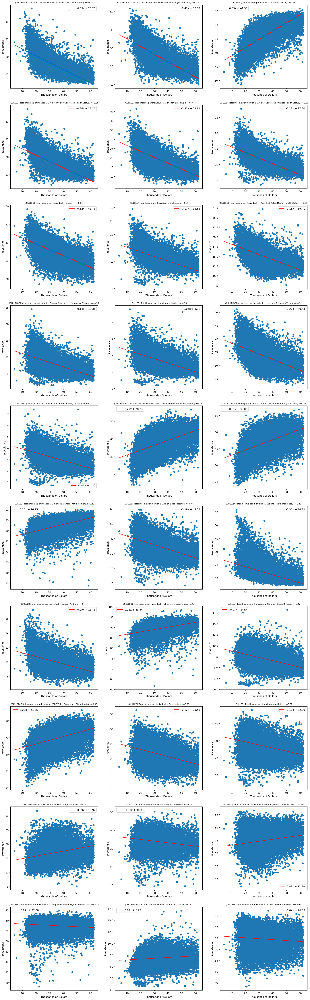

In [54]:
# Redoing linear regression analysis now that the outliers are removed

rows = 10
cols = 3
fig, axs = plt.subplots(rows, cols)
fig.set_figheight(7*rows)
fig.set_figwidth(7*cols)
for i in range(rows):
    for j in range(cols):
        X = culled_strength.index[0]
        Y = culled_strength.index[i*cols+j+1]
        result = reg_this(culled_df[X], culled_df[Y])
        axs[i, j].scatter(culled_df[X], culled_df[Y])
        axs[i, j].plot(culled_df[X], (result.slope*culled_df[X]+result.intercept), label = f"{result.slope:.2f}x + {result.intercept:.2f}", color = "red")
        axs[i, j].set_title(f"(CULLED) {X} v. {Y}, r={result.rvalue:.2f}", fontdict={"fontsize":8})
        axs[i, j].set_xlabel("Thousands of Dollars")
        axs[i, j].set_ylabel("Prevalence")
        axs[i, j].legend(loc="best")
plt.savefig("Results/culled_regressions_WealthvHealth.png")
plt.show()

Through the graphs produced, we can see the extent to which our Wealth variable is a contributing factor to various aspects of health. For example, the linear regression graph between "Total Income per Individual" and "No Leisure Time Physical Activity" predicts that for every $2.4 thousand increase in average total income per capita in a given ZIP Code, the prevalence of people not having time for exercise decreases by 1\%. "Time is money" and a surplus of money definitely affords you the time to do that kind of stuff. Similarly, the more money the average person somewhere has, the more likely they'll have dental visits.

For many of the Health variables, Wealth does seem to be a potent predictor, though there were still surprises like cancer that appeared.

<a id="INS1-3"></a>
### Geographic Visualizations

Sometimes, the results are just more easily shown than described.

In [58]:
# Small Corr-Strength Example

# Plug in desired column in X, your max point size in Y, and the scope of your map in Range
#X = "(Non-Skin) Cancer"
X = "Obesity"
Y = 300

test_df = culled_df.sort_values(X, ascending=False)[["Total Income per Individual", "STATE", X, "lng","lat"]]

# This is just here so people can see the correlation coefficient conveniently
result = reg_this(test_df["Total Income per Individual"], test_df[X])

# State-level views are used because a full nationwide view typically lags too much
# You can use "test_df.loc[~test_df["STATE"].isin(["AK","HI"])]" to see the mainland
# You can use something like "test_df = test_df.loc[test_df["STATE"]=="NY"]" to see a single state
test_df = test_df.loc[~test_df["STATE"].isin(["AK","HI"])]

# A new column is created such that the bigger prevalences are scaled closer to Max Point Size Y while the smaller points are scaled closer to 0
# This accentuates the differences in point size for the purposes of these visualizations
test_df["Scaled"] = (test_df[X]-test_df[X].min()+0.01)**math.log(Y, test_df[X].max()-test_df[X].min())

money_plot = test_df.hvplot.points(
    "lng",
    "lat",
    geo = True,
    tiles = "CartoLight",
    frame_width = 800,
    frame_height = 400,
    color = "Total Income per Individual",
    alpha = .7,
    colorbar = True,
    size = "Scaled",
    xlabel="Longitude",
    ylabel="Latitude",
    title= f"(CULLED) ZIPCODES by MONEY (Color) and {X} (Size), r={result.rvalue:.2f}"
)

print(f"{X} Prevalence from {test_df[X].max()} to {test_df[X].min()}")
money_plot

Obesity Prevalence from 58.5 to 16.7


:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [lng,lat]   (Total Income per Individual,Scaled)

With weaker correlations, the dots on the map seem more chaotic and noisy. There are both rich cities with high prevalence and rich cities with low prevalence. There are both lower-income cities with high prevalence and lower-income cities with low prevalence. At a glance, maps like these help show what kind of phenomena are tied to Wealth.

In [59]:
# Big Corr-Strength Example

# Plug in desired column in X, your max point size in Y, and the scope of your map in Range
X = "Obesity"
Y = 500

test_df = culled_df.sort_values(X, ascending=False)[["Total Income per Individual", "STATE", X, "lng","lat"]]

# This is just here so people can see the correlation coefficient conveniently
result = reg_this(test_df["Total Income per Individual"], test_df[X])

# State-level views are used because a full nationwide view typically lags too much
# You can use "test_df.loc[~test_df["STATE"].isin(["AK","HI"])]" to see the mainland
# You can use something like "test_df = test_df.loc[test_df["STATE"]=="NY"]" to see a single state
test_df = test_df.loc[test_df["STATE"]=="NY"]

# A new column is created such that the bigger prevalences are scaled closer to Max Point Size Y while the smaller points are scaled closer to 0
# This accentuates the differences in point size for the purposes of these visualizations
test_df["Scaled"] = (test_df[X]-test_df[X].min()+0.01)**math.log(Y, test_df[X].max()-test_df[X].min())

money_plot = test_df.hvplot.points(
    "lng",
    "lat",
    geo = True,
    tiles = "CartoLight",
    frame_width = 800,
    frame_height = 400,
    color = "Total Income per Individual",
    cmap = "Greens",
    alpha = .7,
    colorbar = True,
    size = "Scaled",
    xlabel="Longitude",
    ylabel="Latitude",
    title= f"(CULLED) ZIPCODES by MONEY (Color) and {X} (Size), r={result.rvalue:.2f}"
)

print(f"{X} Prevalence from {test_df[X].max()} to {test_df[X].min()}")
money_plot

Obesity Prevalence from 46.9 to 17.3


:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [lng,lat]   (Total Income per Individual,Scaled)

With stronger correlations, patterns seem to form. Generally, bigger dots have a certain color while smaller dots have a different color. When viewed from a geographical perspective, it can be seen that high-income metropolis have different health outcomes from their lower-earning surroundings.

<a id='DC2'></a>
# Question 2: Do richer places have better energy prices?

## Data Cleaning
In the source CSVs for residential electricity rate per kWh, for the column named service_type, Delivery was dropped and Bundled was kept because Bundled signifies an all inclusive rate. Whereas Delivery signifies that consumers are sourcing their electricity from a party other than the utilities and are only paying the utilities a few for using utility instrastructure for getting the electricity to their homes. 

If the same zipcode has multiple utilities (whether Investor-Owened Utilities or Non-Investor-Owned Utilities), the median was taken so that one zipcode only had one electricity rate for data hygiene purposes. 

In [21]:
# Store filepath in a variable
iou_utility = Path("Resources/iou_zipcodes_2020.csv")
non_iou_utility = Path("Resources/non_iou_zipcodes_2020.csv")
lat_long = Path("Resources/AGI+coords_data.csv")

# Read our data file with the Pandas library
iou_utility_df = pd.read_csv(iou_utility)
non_iou_utility_df = pd.read_csv(non_iou_utility)
lat_long_df = pd.read_csv(lat_long)

In [22]:
# Display iou data 
# IOU stands for Investor-Owned Utilities
# These are corporate utilities 
iou_utility_df.head()

,zip,eiaid,utility_name,state,service_type,ownership,comm_rate,ind_rate,res_rate
0,85321,176,Ajo Improvement Co,AZ,Bundled,Investor Owned,0.087890,0.000000,0.093887
1,36560,195,Alabama Power Co,AL,Bundled,Investor Owned,0.121895,0.063652,0.135057
2,36513,195,Alabama Power Co,AL,Bundled,Investor Owned,0.121895,0.063652,0.135057
3,36280,195,Alabama Power Co,AL,Bundled,Investor Owned,0.121895,0.063652,0.135057
4,35473,195,Alabama Power Co,AL,Bundled,Investor Owned,0.121895,0.063652,0.135057


In [23]:
# Drop service type = delivery 
# I kept Bundled because that indicates the full cost of a kWh of electricity
# Whereas Delivery is for where the consumer is sourcing energy from a party other than the utility iself
# And only pay to use the utility infrastructure 
# However, this is not an option available to all electricity markets in the US
# So, only some zipcodes will have Delivery as an option while others won't
# Therefore, it makes sense to keep Bundled and not Delivery 
iou_new = iou_utility_df.loc[iou_utility_df["service_type"]=="Bundled"]

# Remove unnecessary columns 
# eiaid is not used in this analysis 
# comm_rate indicates commercial rate and ind_rate indicates industrial rate
# I am keeping res_rate for residential rate which is applicable in this analysis comparing individual income and energy charge (unit $ per kWh)
iou_new.pop('eiaid')
iou_new.pop('comm_rate')
iou_new.pop('ind_rate')

# Rename zip column to match other csv file for merging purposes 
iou_new = iou_new.rename(columns = {'zip' :'ZIPCODE'})
iou_new.head()

,ZIPCODE,utility_name,state,service_type,ownership,res_rate
0,85321,Ajo Improvement Co,AZ,Bundled,Investor Owned,0.093887
1,36560,Alabama Power Co,AL,Bundled,Investor Owned,0.135057
2,36513,Alabama Power Co,AL,Bundled,Investor Owned,0.135057
3,36280,Alabama Power Co,AL,Bundled,Investor Owned,0.135057
4,35473,Alabama Power Co,AL,Bundled,Investor Owned,0.135057


In [24]:
# Getting median values by grouping by zipcode
# There are zipcodes where there are more than one utilities
# I am cleaning the data to where one zipcode = one residential rate for data hygiene purposes 
iou_new = iou_new.groupby(['ZIPCODE']).median(numeric_only=True)
iou_new.head()

,res_rate
ZIPCODE,
1002,0.240973
1005,0.240973
1007,0.240973
1009,0.240973
1010,0.240973


In [25]:
# Display non iou data 
# Non-IOU stands for Non-Investor-Owned Utilities 
# These utilities are membership cooperatives or small town municipalities
non_iou_utility_df.head()

,zip,eiaid,utility_name,state,service_type,ownership,comm_rate,ind_rate,res_rate
0,39730,55,City of Aberdeen - (MS),MS,Bundled,Municipal,0.106873,0.043796,0.112400
1,38858,55,City of Aberdeen - (MS),MS,Bundled,Municipal,0.106873,0.043796,0.112400
2,21864,84,A & N Electric Coop,MD,Bundled,Cooperative,0.127542,0.000000,0.127045
3,21824,84,A & N Electric Coop,MD,Bundled,Cooperative,0.127542,0.000000,0.127045
4,21866,84,A & N Electric Coop,MD,Bundled,Cooperative,0.127542,0.000000,0.127045


In [26]:
# Drop service type = delivery 
# I kept Bundled because that indicates the full cost of a kWh of electricity
# Whereas Delivery is for where the consumer is sourcing energy from a party other than the utility iself
# And only pay to use the utility infrastructure 
# However, this is not an option available to all electricity markets in the US
# So, only some zipcodes will have Delivery as an option while others won't
# Therefore, it makes sense to keep Bundled and not Delivery 
non_iou_new = non_iou_utility_df.loc[non_iou_utility_df["service_type"]=="Bundled"]

# Remove unnecessary columns 
# eiaid is not used in this analysis 
# comm_rate indicates commercial rate and ind_rate indicates industrial rate
# I am keeping res_rate for residential rate which is applicable in this analysis comparing individual income and energy charge (unit $ per kWh)
non_iou_new.pop('eiaid')
non_iou_new.pop('comm_rate')
non_iou_new.pop('ind_rate')

# Rename zip column to match other csv file for merging purposes
non_iou_new = non_iou_new.rename(columns = {'zip' :'ZIPCODE'})
non_iou_new.head()

,ZIPCODE,utility_name,state,service_type,ownership,res_rate
0,39730,City of Aberdeen - (MS),MS,Bundled,Municipal,0.112400
1,38858,City of Aberdeen - (MS),MS,Bundled,Municipal,0.112400
2,21864,A & N Electric Coop,MD,Bundled,Cooperative,0.127045
3,21824,A & N Electric Coop,MD,Bundled,Cooperative,0.127045
4,21866,A & N Electric Coop,MD,Bundled,Cooperative,0.127045


In [27]:
# Getting median values by grouping by zipcode
# There are zipcodes where there are more than one utilities
# I am cleaning the data to where one zipcode = one residential rate for data hygiene purposes 
non_iou_new = non_iou_new.groupby(['ZIPCODE']).median(numeric_only=True)
non_iou_new.head()

,res_rate
ZIPCODE,
501,0.212208
544,0.212208
1013,0.130938
1014,0.125910
1020,0.130938


In [28]:
# Display lat/long data

lat_long_df.head()

,Unnamed: 0,index,STATE,ZIPCODE,N2,A02650,Total Income per Individual,lng,lat
0,0,12873,MS,38738,140.0,577.0000,4.121429,-90.53653,33.93049
1,1,13576,MO,64147,280.0,1591.0000,5.682143,-94.54688,38.85387
2,2,22399,SD,57794,390.0,3206.0000,8.220513,-102.40695,43.12071
3,3,22477,TN,37140,390.0,3239.0001,8.305128,-87.65245,35.86345
4,4,14171,MT,59444,270.0,2321.0001,8.596297,-111.34881,48.65227


In [29]:
# Remove unnecessary columns
# The following columns are removed because they're not used in this analysis  
lat_long_df.pop('index')
lat_long_df.pop('N2')
lat_long_df.pop('A02650')

lat_long_df.head()

,Unnamed: 0,STATE,ZIPCODE,Total Income per Individual,lng,lat
0,0,MS,38738,4.121429,-90.53653,33.93049
1,1,MO,64147,5.682143,-94.54688,38.85387
2,2,SD,57794,8.220513,-102.40695,43.12071
3,3,TN,37140,8.305128,-87.65245,35.86345
4,4,MT,59444,8.596297,-111.34881,48.65227


In [30]:
# Merging with csv file that includes latitute and longitude for mapping purposes 
iou_merged = iou_new.merge(lat_long_df, on="ZIPCODE", how='inner')
iou_merged.dropna(axis = 'index', how = 'any', inplace = True)
iou_merged.head()

,ZIPCODE,res_rate,Unnamed: 0,STATE,Total Income per Individual,lng,lat
0,1002,0.240973,25131,MA,60.517208,-72.46462,42.37633
1,1005,0.240973,18585,MA,36.737611,-72.10655,42.42117
2,1007,0.240973,22412,MA,44.968338,-72.40009,42.28163
3,1010,0.240973,22108,MA,44.043855,-72.20597,42.12904
4,1012,0.240973,19464,MA,38.033333,-72.84675,42.38495


In [31]:
# Merging with csv file that includes latitute and longitude for mapping purposes
non_iou_merged = non_iou_new.merge(lat_long_df, on="ZIPCODE", how='inner')
non_iou_merged.dropna(axis = 'index', how = 'any', inplace = True)
non_iou_merged.head()

,ZIPCODE,res_rate,Unnamed: 0,STATE,Total Income per Individual,lng,lat
0,1013,0.130938,8680,MA,27.248507,-72.60788,42.16059
1,1020,0.130938,14791,MA,32.324322,-72.56538,42.17618
2,1022,0.125910,16160,MA,33.734524,-72.54249,42.19721
3,1027,0.135965,21427,MA,42.081447,-72.74303,42.29506
4,1030,0.144544,21203,MA,41.509041,-72.67967,42.06869


In [32]:
# Merging iou utilities and non iou utilities for t-test 
total_merged = non_iou_merged.merge(iou_merged, on = "ZIPCODE", how = 'inner')

# Drop unnecessary columns because they're either not needed for analysis or duplicates as the result of merging 
total_merged.pop('STATE_x')
total_merged.pop('STATE_y')
total_merged.pop('Total Income per Individual_x')
total_merged.pop('lng_x')
total_merged.pop('lat_x')
total_merged.pop('Unnamed: 0_x')
total_merged.pop('Unnamed: 0_y')


# Rename Columns 
total_merged = total_merged.rename(columns = {'res_rate_x':'non_iou_rate_per_kWh',
                                              'res_rate_y':'iou_rate_per_kWh',
                                              'Total Income per Individual_y':'Total Income per Individual',
                                              'lng_y':'lng',
                                              'lat_y':'lat'})
total_merged.head()

,ZIPCODE,non_iou_rate_per_kWh,iou_rate_per_kWh,Total Income per Individual,lng,lat
0,1027,0.135965,0.240973,42.081447,-72.74303,42.29506
1,1033,0.125910,0.240973,45.868547,-72.50361,42.26082
2,1056,0.125910,0.240973,41.093951,-72.45805,42.19211
3,1062,0.135965,0.240973,64.852547,-72.69244,42.32146
4,1075,0.130938,0.240973,47.818835,-72.57928,42.25672


<a id='EDA2'></a>
## Exploratory Data Analysis

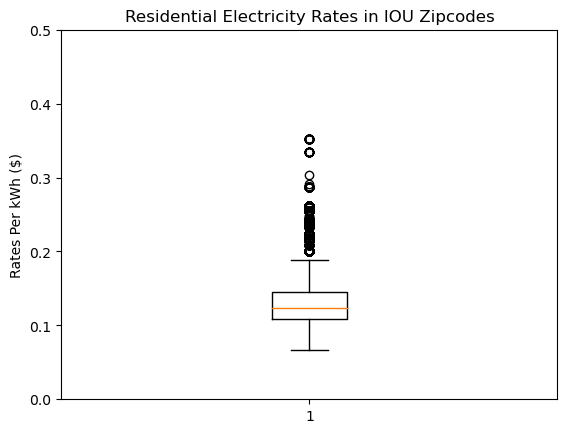

In [33]:
# Box plot for residential electricity rates in Invester-Owned Utilities 
# I chose a boxplot to see if there is a difference in pricing trends for Investor- and Non-Investor-Owned Utilities since the data sets I found differentiated between the two
# Outliers are anything above the $0.20 per kWh mark
# Minimum is around $0.05 per kWh while maximum is around $0.20 per kWh
res_rate = iou_new['res_rate']

fig1, ax1 = plt.subplots()
ax1.set_title('Residential Electricity Rates in IOU Zipcodes')
ax1.set_ylabel('Rates Per kWh ($)')
plt.ylim(0, 0.5)
ax1.boxplot(res_rate)
plt.show()

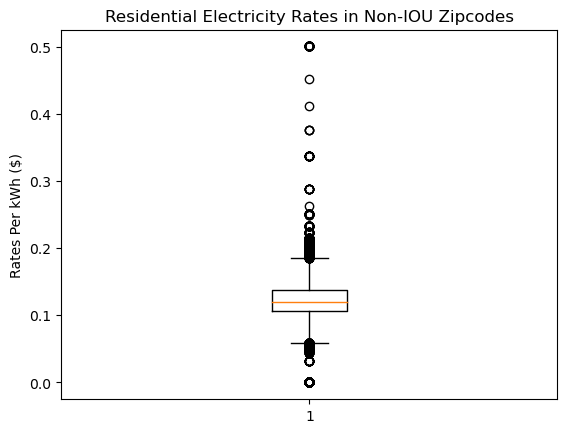

In [34]:
# Box plot for residential electricity rates in Non-Invester-Owned Utilities 
# I chose a boxplot to see if there is a difference in pricing trends for Investor- and Non-Investor-Owned Utilities since the data sets I found differentiated between the two
# Outliers are anything above the $0.20 per kWh mark and below the $0.05 per kWh mark
# Minimum is around $0.05 per kWh while maximum is around $0.20 per kWh
# The middle 50% seems to be within a shorter range compared to the boxplot for IOU Utilities 
non_iou_res_rate = non_iou_new['res_rate']

fig2, ax2 = plt.subplots()
ax2.set_title('Residential Electricity Rates in Non-IOU Zipcodes')
ax2.set_ylabel('Rates Per kWh ($)')
ax2.boxplot(non_iou_res_rate)
plt.show()

<a id='INS2'></a>
## Insights

In [35]:
# T-Test
# The boxplots showed that IOU and Non-IOU electricity rates have similar medians
# Does that mean they have the same mean as well?
# We can use a T-Test to find the answer statistically 
# The null is that the two populations have the same mean 
# The p-value is the probability of obtaining results assuming that the null hypothesis is correct
# Here, the p-value is less than 0.05
# Which means that we reject the null hypothesis that the two population means are equal 

st.ttest_ind(total_merged.non_iou_rate_per_kWh, total_merged.iou_rate_per_kWh, equal_var=False)

Ttest_indResult(statistic=-3.108875509983721, pvalue=0.0018805018095221677)

In [36]:
# Map showing income and residential electricity rates for IOUs
# Color indicates electricity rates
# Size of dots indicate income
energy_map1 = iou_merged.hvplot.points(
    "lng",
    "lat",
    geo = True,
    tiles = "CartoLight",
    frame_width = 800,
    frame_height = 600,
    scale = 1,
    color = "res_rate",
    size = "Total Income per Individual",
    colorbar = True,
    xlabel="Longitude",
    ylabel="Latitude",
    title= "Income and Residential Electricity Rates for Investor-Owned Utilities"
)
energy_map1

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [lng,lat]   (res_rate,Total Income per Individual)

In [37]:
# Map showing income and residential electricity rates for Non-IOUs
# Color indicates electricity rates
# Size of dots indicate income
energy_map2 = non_iou_merged.hvplot.points(
    "lng",
    "lat",
    geo = True,
    tiles = "CartoLight",
    frame_width = 800,
    frame_height = 600,
    scale = 1,
    color = "res_rate",
    size = "Total Income per Individual",
    colorbar = True,
    xlabel="Longitude",
    ylabel="Latitude",
    title= "Income and Residential Electricity Rates for Non-Investor-Owned Utilities"
)
energy_map2

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [lng,lat]   (res_rate,Total Income per Individual)

The r-squared is: 0.029536779118478212


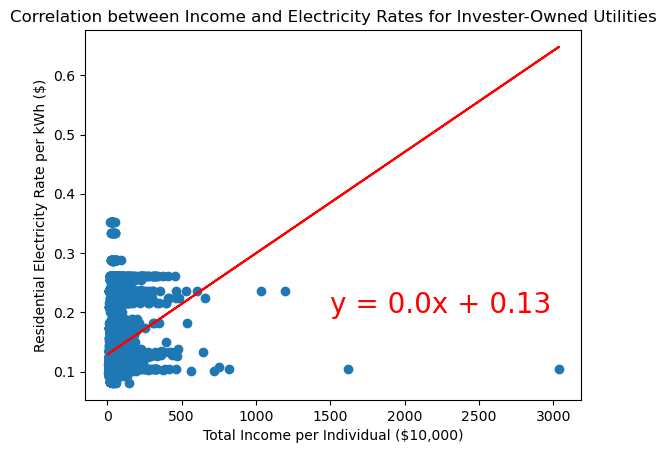

In [38]:
# Linear regression for Invester-Owned Utilities
# By looking at the map, it does not seem that there is a correlation between income and residential electricity rates
# We can confirm this by doing a linear regression with the data
# When the r-value is close to the extremes of the range -1 to 1, it means that there is a strong correlation
# My result shows the opposite of that, which proves that there is no correlation between income and residential electricity rates
# Per my anecdotal experience, this is correct
# Electricity rates are dictated by what's going on in their perspective Independent System Operator (ISO) markets within the US and not purely based off of income
# It would be interesting to see if income and electricity rates correlate within the same ISO

x_values = iou_merged['Total Income per Individual']
y_values = iou_merged['res_rate']
(slope, intercept, rvalue, pvalue, stderr) = linregress(x_values, y_values)
regress_values = x_values * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))
plt.scatter(x_values,y_values)
plt.plot(x_values,regress_values,"r-")
plt.annotate(line_eq,(1500,0.2),fontsize=20,color="red")
plt.xlabel('Total Income per Individual ($10,000)')
plt.ylabel('Residential Electricity Rate per kWh ($)')
plt.title('Correlation between Income and Electricity Rates for Invester-Owned Utilities')
print(f"The r-squared is: {rvalue**2}")
plt.show()

The r-squared is: 0.01611620953974901


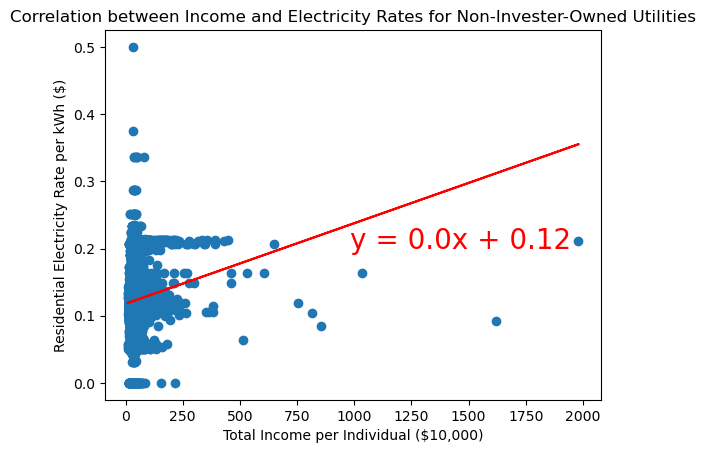

In [39]:
# Linear regression for Non-Invester-Owned Utilities
# By looking at the map, it does not seem that there is a correlation between income and residential electricity rates
# We can confirm this by doing a linear regression with the data
# When the r-value is close to the extremes of the range -1 to 1, it means that there is a strong correlation
# My result shows the opposite of that, which proves that there is no correlation between income and residential electricity rates
# Per my anecdotal experience, this is correct
# Electricity rates are dictated by what's going on in their perspective Independent System Operator (ISO) markets within the US and not purely based off of income
# It would be interesting to see if income and electricity rates correlate within the same ISO

x_values = non_iou_merged['Total Income per Individual']
y_values = non_iou_merged['res_rate']
(slope, intercept, rvalue, pvalue, stderr) = linregress(x_values, y_values)
regress_values = x_values * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))
plt.scatter(x_values,y_values)
plt.plot(x_values,regress_values,"r-")
plt.annotate(line_eq,(980,0.2),fontsize=20,color="red")
plt.xlabel('Total Income per Individual ($10,000)')
plt.ylabel('Residential Electricity Rate per kWh ($)')
plt.title('Correlation between Income and Electricity Rates for Non-Invester-Owned Utilities')
print(f"The r-squared is: {rvalue**2}")
plt.show()

<a id='DC3'></a>
# Question 3: Do richer places have better public order?

## Data Cleaning
The code reads and manipulates two datasets: "wage_estimates" and "crime_data." 

The "wage_estimates" dataset contains information about wage estimates for various occupations in different states. It creates a summary dataframe called "wage_estimates_summary" with columns "State," "Occupation," "Average hourly wage," "Average annual wage," "Median hourly wage," and "Median annual wage." The "crime_data" dataset contains information about crime statistics in different states. It selects specific columns from the "crime_data" dataset to create a summary dataframe called "crime_summary." The code filters the "crime_summary" dataframe to keep only data for 2020, creating a new dataframe called "crime_data_2020." Then, the code merges the "wage_estimates_summary" and "crime_data_2020" dataframes based on the common "State" column.

Finally, the code creates a scatter plot using the matplotlib library in Python, displaying the relationship between average annual wage and total crimes in 2020. The plot is labeled "Average Annual Wage vs Total Crimes (2020)." A linear regression line is fitted to the data using the numpy library's polyfit function, and the slope and y-intercept are calculated. The correlation coefficient is calculated using the scipy library's pearsonr function, indicating a positive but moderate correlation between the two variables. The plot displays the relationship visually, with the trend line illustrating the direction of the relationship and the correlation coefficient providing a numerical measure of the strength of the correlation.

In [40]:
# File to Load
wage_estimates_to_load = Path("Resources/May 2022 State Occupational Employment and Wage Estimates.csv")
crime_data_load = Path("Resources/estimated_crimes_1979_2020.csv")

# Read Data File and store into Pandas DataFrames
wage_estimates = pd.read_csv(wage_estimates_to_load)
crime_data = pd.read_csv(crime_data_load)

wage_estimates.head()

,AREA,AREA_TITLE,AREA_TYPE,PRIM_STATE,NAICS,NAICS_TITLE,I_GROUP,OWN_CODE,OCC_CODE,OCC_TITLE,...,H_MEDIAN,H_PCT75,H_PCT90,A_PCT10,A_PCT25,A_MEDIAN,A_PCT75,A_PCT90,ANNUAL,HOURLY
0,1,Alabama,2,AL,0,Cross-industry,cross-industry,1235,00-0000,All Occupations,...,18.50,28.94,43.25,"21,580","28,030","38,470","60,190","89,950",NaN,NaN
1,1,Alabama,2,AL,0,Cross-industry,cross-industry,1235,11-0000,Management Occupations,...,46.12,63.53,86.89,"47,680","66,210","95,940","132,150","180,730",NaN,NaN
2,1,Alabama,2,AL,0,Cross-industry,cross-industry,1235,11-1011,Chief Executives,...,65.83,90.64,#,"50,920","108,470","136,930","188,530",#,NaN,NaN
3,1,Alabama,2,AL,0,Cross-industry,cross-industry,1235,11-1021,General and Operations Managers,...,47.17,71.64,105.19,"44,530","65,280","98,120","149,010","218,800",NaN,NaN
4,1,Alabama,2,AL,0,Cross-industry,cross-industry,1235,11-1031,Legislators,...,*,*,*,"17,080","18,130","20,320","35,730","57,060",True,NaN


In [41]:
# Remove unwanted columms
wage_estimates_summary = wage_estimates[["PRIM_STATE", "OCC_TITLE", "H_MEAN", "A_MEAN", "H_MEDIAN","A_MEDIAN"]]
wage_estimates_summary


,PRIM_STATE,OCC_TITLE,H_MEAN,A_MEAN,H_MEDIAN,A_MEDIAN
0,AL,All Occupations,24.34,"50,620",18.50,"38,470"
1,AL,Management Occupations,53.13,"110,500",46.12,"95,940"
2,AL,Chief Executives,91.67,"190,680",65.83,"136,930"
3,AL,General and Operations Managers,58.00,"120,640",47.17,"98,120"
4,AL,Legislators,*,"30,000",*,"20,320"
...,...,...,...,...,...,...
37564,VI,Industrial Truck and Tractor Operators,15.97,"33,210",15.15,"31,520"
37565,VI,Cleaners of Vehicles and Equipment,13.98,"29,080",13.92,"28,950"
37566,VI,"Laborers and Freight, Stock, and Material Move...",14.58,"30,320",13.73,"28,550"
37567,VI,"Packers and Packagers, Hand",13.35,"27,770",12.59,"26,180"


In [42]:
# Rename the columns
wage_estimates_summary = wage_estimates_summary.rename(columns={
    'PRIM_STATE': 'State',
    'OCC_TITLE': 'Occupation',
    'H_MEAN': 'Average hourly wage',
    'A_MEAN': 'Average annual wage',
    'H_MEDIAN': 'Median hourly wage',
    'A_MEDIAN': 'Median annual wage'
})

wage_estimates_summary.head()


,State,Occupation,Average hourly wage,Average annual wage,Median hourly wage,Median annual wage
0,AL,All Occupations,24.34,"50,620",18.50,"38,470"
1,AL,Management Occupations,53.13,"110,500",46.12,"95,940"
2,AL,Chief Executives,91.67,"190,680",65.83,"136,930"
3,AL,General and Operations Managers,58.00,"120,640",47.17,"98,120"
4,AL,Legislators,*,"30,000",*,"20,320"


In [43]:
# show only the rows related to Data Scientists
data_scientists = wage_estimates_summary[(wage_estimates_summary['Occupation'] == 'Data Scientists')]
data_scientists.head()

,State,Occupation,Average hourly wage,Average annual wage,Median hourly wage,Median annual wage
85,AL,Data Scientists,44.03,"91,570",41.29,"85,870"
815,AK,Data Scientists,49.91,"103,810",48.09,"100,040"
1390,AZ,Data Scientists,50.11,"104,220",49.41,"102,770"
2845,CA,Data Scientists,70.86,"147,390",60.97,"126,810"
3671,CO,Data Scientists,56.04,"116,560",49.62,"103,200"


In [44]:
# Display the first few rows of the crime_data DataFrame
crime_data


,year,state_abbr,state_name,population,violent_crime,homicide,rape_legacy,rape_revised,robbery,aggravated_assault,property_crime,burglary,larceny,motor_vehicle_theft,caveats,total_crimes
0,1979,AK,Alaska,406000,1994,54,292.0,NaN,445,1203,23193,5616,15076,2501,NaN,50374
1,1979,AL,Alabama,3769000,15578,496,1037.0,NaN,4127,9918,144372,48517,83791,12064,NaN,319900
2,1979,AR,Arkansas,2180000,7984,198,595.0,NaN,1626,5565,70949,21457,45267,4225,NaN,157866
3,1979,AZ,Arizona,2450000,14528,219,1120.0,NaN,4305,8884,177977,48916,116976,12085,NaN,385010
4,1979,CA,California,22696000,184087,2952,12239.0,NaN,75767,93129,1511021,496310,847148,167563,NaN,3390216
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2137,2020,VT,Vermont,623347,1081,14,NaN,213.0,64,790,7586,961,6361,264,NaN,17334
2138,2020,WA,Washington,7693612,22596,301,NaN,2677.0,5183,14435,210223,40167,142657,27399,NaN,465638
2139,2020,WI,Wisconsin,5832655,18861,308,NaN,2020.0,3081,13452,86654,12744,64517,9393,NaN,211030
2140,2020,WV,West Virginia,1784787,6352,117,NaN,832.0,369,5034,24976,4877,17828,2271,NaN,62656


In [45]:
# Filter the crime_data to select only the relevant columns

crime_summary = crime_data[["year", "state_abbr", "total_crimes"]]
crime_summary

,year,state_abbr,total_crimes
0,1979,AK,50374
1,1979,AL,319900
2,1979,AR,157866
3,1979,AZ,385010
4,1979,CA,3390216
...,...,...,...
2137,2020,VT,17334
2138,2020,WA,465638
2139,2020,WI,211030
2140,2020,WV,62656


In [46]:
# Rename the columns
crime_summary = crime_summary.rename(columns={
    'year': 'Year',
    'state_abbr': 'State',
    'total_crimes': 'Total Crimes'
})

crime_summary.head()

,Year,State,Total Crimes
0,1979,AK,50374
1,1979,AL,319900
2,1979,AR,157866
3,1979,AZ,385010
4,1979,CA,3390216


In [47]:
# Filter the DataFrame to keep only the year 2020
crime_data_2020 = crime_summary[crime_summary['Year'] == 2020]


crime_data_2020

,Year,State,Total Crimes
2091,2020,AK,45308
2092,2020,AL,254966
2093,2020,AR,199126
2094,2020,AZ,402606
2095,2020,CA,2032160
2096,2020,CO,378304
2097,2020,CT,124258
2098,2020,DC,64052
2099,2020,DE,47234
2100,2020,FL,935848


In [48]:
# Merge the data_scientists DataFrame and the crime_data_2020 DataFrame based on the 'State' column
combined_data = pd.merge(data_scientists.replace(" ", ""), crime_data_2020.replace(" ", ""), on='State', how="left")
combined_data

,State,Occupation,Average hourly wage,Average annual wage,Median hourly wage,Median annual wage,Year,Total Crimes
0,AL,Data Scientists,44.03,"91,570",41.29,"85,870",2020.0,254966.0
1,AK,Data Scientists,49.91,"103,810",48.09,"100,040",2020.0,45308.0
2,AZ,Data Scientists,50.11,"104,220",49.41,"102,770",2020.0,402606.0
3,CA,Data Scientists,70.86,"147,390",60.97,"126,810",2020.0,2032160.0
4,CO,Data Scientists,56.04,"116,560",49.62,"103,200",2020.0,378304.0
5,CT,Data Scientists,52.99,"110,220",50.82,"105,700",2020.0,124258.0
6,DE,Data Scientists,64.10,"133,320",63.61,"132,300",2020.0,47234.0
7,DC,Data Scientists,52.98,"110,190",46.95,"97,660",2020.0,64052.0
8,FL,Data Scientists,48.45,"100,780",48.33,"100,520",2020.0,935848.0
9,GA,Data Scientists,51.16,"106,400",48.27,"100,400",2020.0,515676.0


In [49]:
# Replace non-numeric values with NaN
combined_data = combined_data.replace('*', np.nan)

In [50]:
# Drop rows with missing values
combined_data_clean = combined_data.dropna()
combined_data_clean

,State,Occupation,Average hourly wage,Average annual wage,Median hourly wage,Median annual wage,Year,Total Crimes
0,AL,Data Scientists,44.03,"91,570",41.29,"85,870",2020.0,254966.0
1,AK,Data Scientists,49.91,"103,810",48.09,"100,040",2020.0,45308.0
2,AZ,Data Scientists,50.11,"104,220",49.41,"102,770",2020.0,402606.0
3,CA,Data Scientists,70.86,"147,390",60.97,"126,810",2020.0,2032160.0
4,CO,Data Scientists,56.04,"116,560",49.62,"103,200",2020.0,378304.0
5,CT,Data Scientists,52.99,"110,220",50.82,"105,700",2020.0,124258.0
6,DE,Data Scientists,64.10,"133,320",63.61,"132,300",2020.0,47234.0
7,DC,Data Scientists,52.98,"110,190",46.95,"97,660",2020.0,64052.0
8,FL,Data Scientists,48.45,"100,780",48.33,"100,520",2020.0,935848.0
9,GA,Data Scientists,51.16,"106,400",48.27,"100,400",2020.0,515676.0


In [51]:
# Convert incompatible data types
combined_data_clean = combined_data_clean.replace(to_replace=",", value="", regex=True)
combined_data_clean["Average annual wage"] = combined_data_clean["Average annual wage"].astype("float64")
combined_data_clean.dtypes

State                   object
Occupation              object
Average hourly wage     object
Average annual wage    float64
Median hourly wage      object
Median annual wage      object
Year                   float64
Total Crimes           float64
dtype: object

<a id='INS3'></a>
## Insights

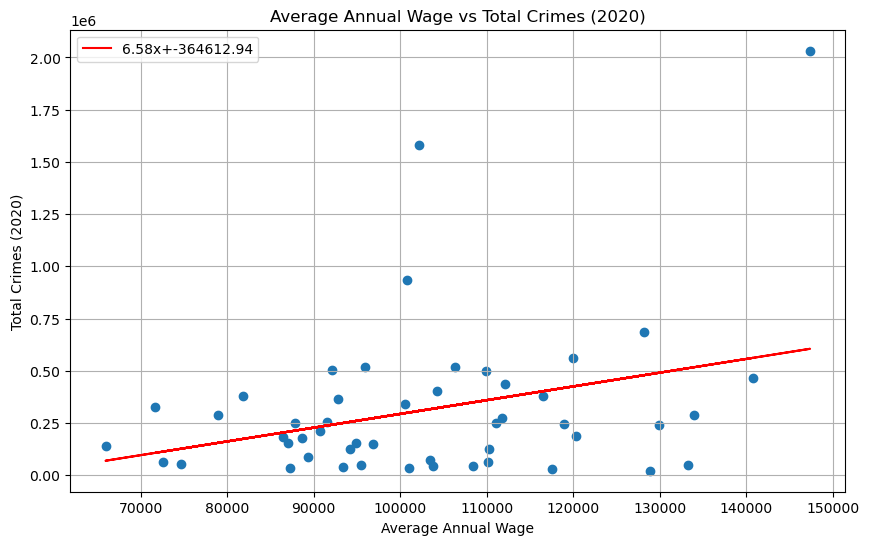

The correlation coefficient between Average Annual Wage and Total Crimes is 0.33


In [52]:
# Scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(combined_data_clean['Average annual wage'], combined_data_clean['Total Crimes'])
plt.xlabel('Average Annual Wage')
plt.ylabel('Total Crimes (2020)')
plt.title('Average Annual Wage vs Total Crimes (2020)')
plt.grid(True)

x = combined_data_clean['Average annual wage']
y = combined_data_clean['Total Crimes']
m, b = np.polyfit(x, y, 1)

plt.plot(x, m*x + b, color='red', label=f"{m:.2f}x+{b:.2f}")

plt.legend()
plt.show()

# Calculate the correlation coefficient between Average Annual Wage and Total Crimes
correlation_coefficient = round(st.pearsonr(combined_data_clean['Average annual wage'], combined_data_clean['Total Crimes'])[0], 2)
print(f"The correlation coefficient between Average Annual Wage and Total Crimes is {correlation_coefficient}")
